# 7072CEM - MACHINE LEARNING

In [66]:
###import libraries###
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot 
init_notebook_mode(connected=True)   
import os

In [68]:
#load dataset
data = pd.read_csv("C:/Users/prabh/OneDrive/Desktop/Machine learning/google_review_ratings.csv")
data

,User,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,...,Category 16,Category 17,Category 18,Category 19,Category 20,Category 21,Category 22,Category 23,Category 24,Unnamed: 25
0,User 1,0.00,0.00,3.63,3.65,5.00,2.92,5.00,2.35,2.33,...,0.59,0.50,0.00,0.50,0.00,0.00,0.0,0.0,0.00,NaN
1,User 2,0.00,0.00,3.63,3.65,5.00,2.92,5.00,2.64,2.33,...,0.59,0.50,0.00,0.50,0.00,0.00,0.0,0.0,0.00,NaN
2,User 3,0.00,0.00,3.63,3.63,5.00,2.92,5.00,2.64,2.33,...,0.59,0.50,0.00,0.50,0.00,0.00,0.0,0.0,0.00,NaN
3,User 4,0.00,0.50,3.63,3.63,5.00,2.92,5.00,2.35,2.33,...,0.59,0.50,0.00,0.50,0.00,0.00,0.0,0.0,0.00,NaN
4,User 5,0.00,0.00,3.63,3.63,5.00,2.92,5.00,2.64,2.33,...,0.59,0.50,0.00,0.50,0.00,0.00,0.0,0.0,0.00,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5451,User 5452,0.91,5.00,4.00,2.79,2.77,2.57,2.43,1.09,1.77,...,0.66,0.65,0.66,0.69,5.00,1.05,5.0,5.0,1.56,NaN
5452,User 5453,0.93,5.00,4.02,2.79,2.78,2.57,1.77,1.07,1.76,...,0.65,0.64,0.65,1.59,1.62,1.06,5.0,5.0,1.09,NaN
5453,User 5454,0.94,5.00,4.03,2.80,2.78,2.57,1.75,1.05,1.75,...,0.65,0.63,0.64,0.74,5.00,1.07,5.0,5.0,1.11,NaN
5454,User 5455,0.95,4.05,4.05,2.81,2.79,2.44,1.76,1.03,1.74,...,0.64,0.63,0.64,0.75,5.00,1.08,5.0,5.0,1.12,NaN


# data preprocessing
to clean this data i perform this technique in this section i did drop user columns because it contains catagorical value we dont need that for clustering methods i did this process for each 3 methods.

In [27]:
data = data.loc[:, ~df.columns.str.contains('^Unnamed')]
data.info()
Cols = [str(i) for i in range(1,25)]
Cols =['Category '+i for i in Cols]
for i in Cols:
    data[i] = pd.to_numeric(data[i],errors = 'coerce')
    data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5456 entries, 0 to 5455
Data columns (total 26 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   User         5456 non-null   object 
 1   Category 1   5456 non-null   float64
 2   Category 2   5456 non-null   float64
 3   Category 3   5456 non-null   float64
 4   Category 4   5456 non-null   float64
 5   Category 5   5456 non-null   float64
 6   Category 6   5456 non-null   float64
 7   Category 7   5456 non-null   float64
 8   Category 8   5456 non-null   float64
 9   Category 9   5456 non-null   float64
 10  Category 10  5456 non-null   float64
 11  Category 11  5456 non-null   object 
 12  Category 12  5455 non-null   float64
 13  Category 13  5456 non-null   float64
 14  Category 14  5456 non-null   float64
 15  Category 15  5456 non-null   float64
 16  Category 16  5456 non-null   float64
 17  Category 17  5456 non-null   float64
 18  Category 18  5456 non-null   float64
 19  Catego

In [29]:
data.isnull().sum()

User              0
Category 1        0
Category 2        0
Category 3        0
Category 4        0
Category 5        0
Category 6        0
Category 7        0
Category 8        0
Category 9        0
Category 10       0
Category 11       1
Category 12       1
Category 13       0
Category 14       0
Category 15       0
Category 16       0
Category 17       0
Category 18       0
Category 19       0
Category 20       0
Category 21       0
Category 22       0
Category 23       0
Category 24       1
Unnamed: 25    5454
dtype: int64

In [30]:
data= df.fillna(df.mean())

C:\Users\prabh\AppData\Local\Temp/ipykernel_7728/373060997.py:1: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



In [6]:
data.isnull().sum()

User           0
Category 1     0
Category 2     0
Category 3     0
Category 4     0
Category 5     0
Category 6     0
Category 7     0
Category 8     0
Category 9     0
Category 10    0
Category 11    0
Category 12    0
Category 13    0
Category 14    0
Category 15    0
Category 16    0
Category 17    0
Category 18    0
Category 19    0
Category 20    0
Category 21    0
Category 22    0
Category 23    0
Category 24    0
dtype: int64

In [7]:
data.describe()

,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,Category 10,...,Category 15,Category 16,Category 17,Category 18,Category 19,Category 20,Category 21,Category 22,Category 23,Category 24
count,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.00000,5456.000000,5456.000000,5456.000000,5456.000000,...,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000
mean,1.455720,2.319707,2.489331,2.796886,2.958941,2.89349,3.351395,2.540795,3.126019,2.832729,...,2.206573,1.192801,0.949203,0.822414,0.969811,1.000071,0.965838,1.750537,1.531453,1.560755
std,0.827604,1.421438,1.247815,1.309159,1.339056,1.28240,1.413492,1.111391,1.356802,1.307665,...,1.715961,1.107005,0.973536,0.947911,1.203972,1.193891,0.929853,1.598734,1.316889,1.171649
min,0.000000,0.000000,0.000000,0.830000,1.120000,1.11000,1.120000,0.860000,0.840000,0.810000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.920000,1.360000,1.540000,1.730000,1.770000,1.79000,1.930000,1.620000,1.800000,1.640000,...,0.860000,0.690000,0.580000,0.530000,0.520000,0.540000,0.570000,0.740000,0.790000,0.880000
50%,1.340000,1.905000,2.060000,2.460000,2.670000,2.68000,3.230000,2.170000,2.800000,2.680000,...,1.330000,0.800000,0.740000,0.690000,0.690000,0.690000,0.760000,1.030000,1.070000,1.290000
75%,1.810000,2.682500,2.740000,4.092500,4.312500,3.84000,5.000000,3.190000,5.000000,3.530000,...,4.440000,1.160000,0.910000,0.840000,0.860000,0.860000,1.000000,2.070000,1.560000,1.660000
max,5.000000,5.000000,5.000000,5.000000,5.000000,5.00000,5.000000,5.000000,5.000000,5.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


# examine the number of reviews for each places

Text(0.5, 1.0, 'Average_Rating_for_each_places ')

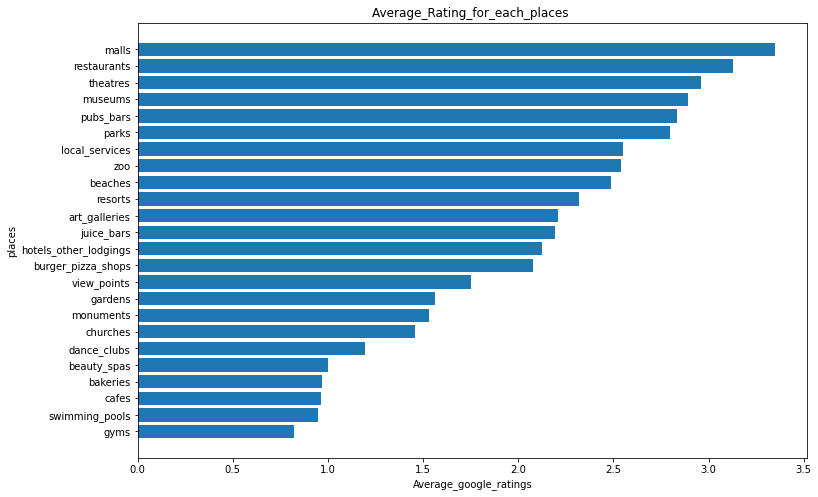

In [32]:
Average = data[New_cols[1:]].mean()
Average = Average.sort_values()
plt.figure(figsize=(12,8))
plt.barh(np.arange(len(New_cols[1:])), Average.values, align='center')
plt.yticks(np.arange(len(New_cols[1:])), Average.index)
plt.ylabel('places')
plt.xlabel('Average_google_ratings')
plt.title('Average_Rating_for_each_places ')

# HEAT MAP

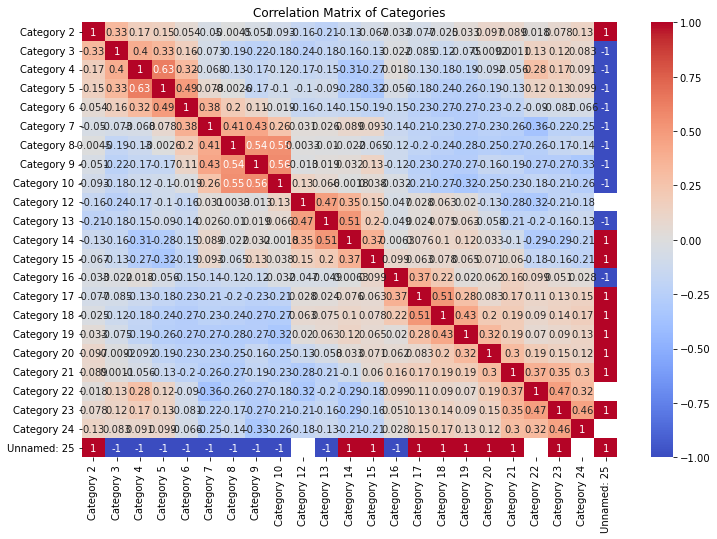

In [72]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have loaded the dataset into a DataFrame called 'df'
df = pd.read_csv("C:/Users/prabh/OneDrive/Desktop/Machine learning/google_review_ratings.csv")
# Select the columns representing the categories
category_cols = df.columns[2:]  # Exclude the first column (user ID)

# Calculate the correlation matrix
correlation_matrix = df[category_cols].corr()

# Visualize the correlation matrix as a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.title("Correlation Matrix of Categories")
plt.show()

K-MEAN  Clustering¶

K-means clustering is a data clustering technique used to group similar instances into a predefined number of clusters based on our attribute values.We start with KMean Clustering, with determining the pefect number of clusters with the Elbow Method with Within-Cluster-Sum-of-Squares (WCSS), which is applied followes

In [59]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans

# Load the dataset
data = pd.read_csv('C:/Users/prabh/OneDrive/Desktop/Machine learning/google_review_ratings.csv')

column_names = ['User_id', 'churches', 'resorts', 'beaches', 'parks', 
                'theatres', 'museums', 'malls', 'zoo', 'restaurants', 
                'pubs_bars', 'local_services', 'burger_pizza_shops', 
                'hotels_other_lodgings', 'juice_bars', 'art_galleries', 
                'dance_clubs', 'swimming_pools', 'gyms', 'bakeries', 
                'beauty_spas', 'cafes', 'view_points', 'monuments', 'gardens','na']
data.columns = column_names

# Clean the dataset
data = data.drop('User_id', axis=1)  # Remove irrelevant column
data = data.replace('\t', '', regex=True)  # Remove tabs
data = data.apply(pd.to_numeric, errors='coerce')  # Convert values to numeric, replacing non-numeric values with NaN
data = data.fillna(0)  # Fill NaN values with 0

# Perform K-means clustering
k = 3  # Number of clusters
kmeans = KMeans(n_clusters=k)
kmeans.fit(data)

# Get the cluster labels for each data point
cluster_labels = kmeans.labels_

# Print the cluster labels for each data point
for i, label in enumerate(cluster_labels):
    print("Data point", i+1, "belongs to Cluster", label+1)

# Print the cluster centers
cluster_centers = kmeans.cluster_centers_
print("\nCluster Centers:")
for i, center in enumerate(cluster_centers):
    print("Cluster", i+1, "Center:", center)

Data point 1 belongs to Cluster 2
Data point 2 belongs to Cluster 2
Data point 3 belongs to Cluster 2
Data point 4 belongs to Cluster 2
Data point 5 belongs to Cluster 2
Data point 6 belongs to Cluster 2
Data point 7 belongs to Cluster 2
Data point 8 belongs to Cluster 2
Data point 9 belongs to Cluster 2
Data point 10 belongs to Cluster 2
Data point 11 belongs to Cluster 2
Data point 12 belongs to Cluster 2
Data point 13 belongs to Cluster 2
Data point 14 belongs to Cluster 2
Data point 15 belongs to Cluster 2
Data point 16 belongs to Cluster 2
Data point 17 belongs to Cluster 2
Data point 18 belongs to Cluster 2
Data point 19 belongs to Cluster 2
Data point 20 belongs to Cluster 2
Data point 21 belongs to Cluster 2
Data point 22 belongs to Cluster 2
Data point 23 belongs to Cluster 2
Data point 24 belongs to Cluster 2
Data point 25 belongs to Cluster 3
Data point 26 belongs to Cluster 3
Data point 27 belongs to Cluster 3
Data point 28 belongs to Cluster 2
Data point 29 belongs to Clus

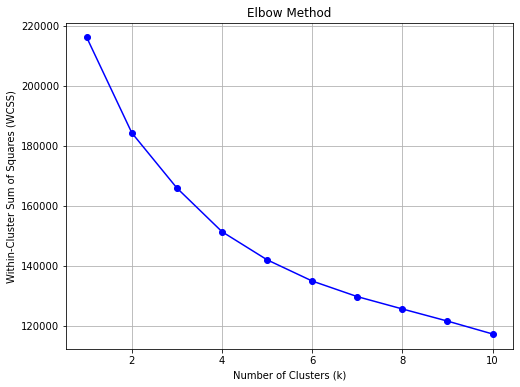

In [69]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Load the dataset
data = pd.read_csv('C:/Users/prabh/OneDrive/Desktop/Machine learning/google_review_ratings.csv')

column_names = ['User_id', 'churches', 'resorts', 'beaches', 'parks', 
                'theatres', 'museums', 'malls', 'zoo', 'restaurants', 
                'pubs_bars', 'local_services', 'burger_pizza_shops', 
                'hotels_other_lodgings', 'juice_bars', 'art_galleries', 
                'dance_clubs', 'swimming_pools', 'gyms', 'bakeries', 
                'beauty_spas', 'cafes', 'view_points', 'monuments', 'gardens','na']
data.columns = column_names

# Clean the dataset
data = data.drop('User_id', axis=1)  # Remove irrelevant column
data = data.replace('\t', '', regex=True)  # Remove tabs
data = data.apply(pd.to_numeric, errors='coerce')  # Convert values to numeric, replacing non-numeric values with NaN
data = data.fillna(0)  # Fill NaN values with 0

# Perform K-means clustering for different k values
k_values = range(1, 11)  # Test k values from 1 to 10
wcss = []  # List to store the within-cluster sum of squares

for k in k_values:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(data)
    wcss.append(kmeans.inertia_)  # Append WCSS to the list

# Plot the elbow curve
plt.figure(figsize=(8, 6))
plt.plot(k_values, wcss, 'bo-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.title('Elbow Method')
plt.grid(True)
plt.show()


# PAIR PLOT FOR MORE CLARRIFICATION

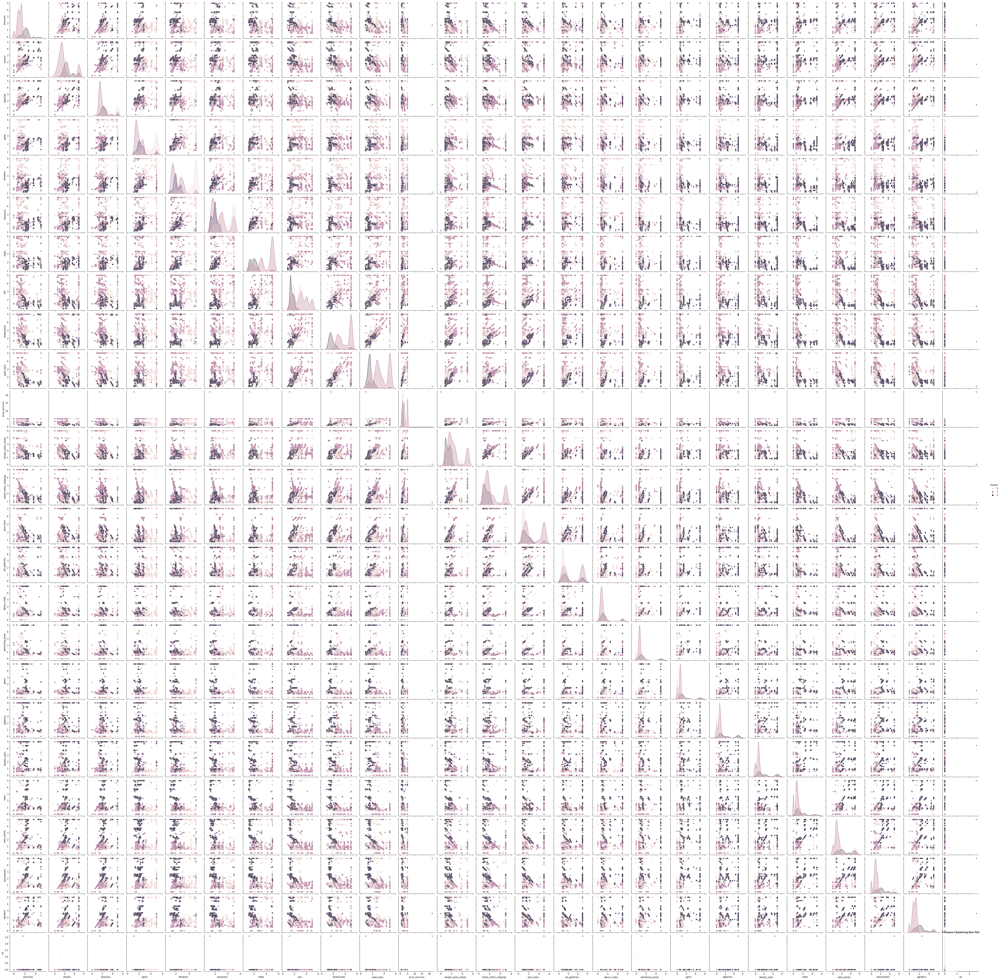

In [60]:
# Perform K-means clustering
k = 3  # Number of clusters
kmeans = KMeans(n_clusters=k)
kmeans.fit(data)

# Add the cluster labels to the dataset
data['Cluster'] = kmeans.labels_

# Create a pair plot
sns.pairplot(data, hue='Cluster', plot_kws={'alpha': 0.5})
plt.title('K-means Clustering Pair Plot')
plt.show()


# DBSCAN
DBSCAN (Density-Based Spatial Clustering of Applications with Noise) is a clustering algorithm used to identify dense regions in the data and assign data points to clusters based on their density, without assuming any specific number of clusters in advance.


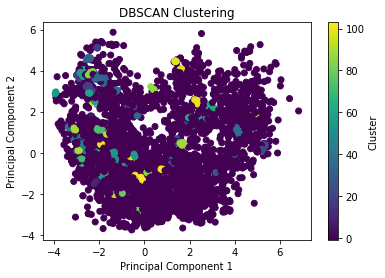

In [65]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Load the dataset
data = pd.read_csv('C:/Users/prabh/OneDrive/Desktop/Machine learning/google_review_ratings.csv')
column_names = ['User_id', 'churches', 'resorts', 'beaches', 'parks', 
                'theatres', 'museums', 'malls', 'zoo', 'restaurants', 
                'pubs_bars', 'local_services', 'burger_pizza_shops', 
                'hotels_other_lodgings', 'juice_bars', 'art_galleries', 
                'dance_clubs', 'swimming_pools', 'gyms', 'bakeries', 
                'beauty_spas', 'cafes', 'view_points', 'monuments', 'gardens','na']
data.columns = column_names

# Clean the dataset
data = data.drop('User_id', axis=1)  # Remove irrelevant column
data = data.replace('\t', '', regex=True)  # Remove tabs
data = data.apply(pd.to_numeric, errors='coerce')  # Convert values to numeric, replacing non-numeric values with NaN
data = data.fillna(0)  # Fill NaN values with 0

# Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# Apply PCA for dimensionality reduction
pca = PCA(n_components=2)
data_pca = pca.fit_transform(data_scaled)
data_pca
# Perform DBSCAN clustering
dbscan = DBSCAN(eps=0.5, min_samples=5)
clusters = dbscan.fit_predict(data_scaled)

# Plot the clusters
plt.scatter(data_pca[:, 0], data_pca[:, 1], c=clusters, cmap='viridis')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('DBSCAN Clustering')
plt.colorbar(label='Cluster')
plt.show()


# Hierarchical Clustering

Hierarchical Clustering is a method used to group similar data points into clusters based on their proximity, forming a hierarchy of clusters that can be visualized in a dendrogram.

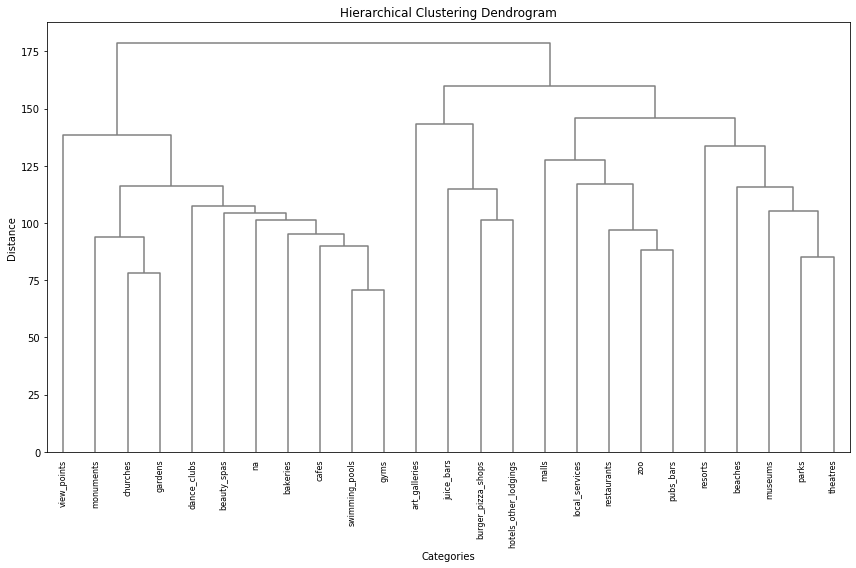

In [73]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

# Load the dataset
data = pd.read_csv('C:/Users/prabh/OneDrive/Desktop/Machine learning/google_review_ratings.csv')
data

column_names = ['User_id', 'churches', 'resorts', 'beaches', 'parks', 
                'theatres', 'museums', 'malls', 'zoo', 'restaurants', 
                'pubs_bars', 'local_services', 'burger_pizza_shops', 
                'hotels_other_lodgings', 'juice_bars', 'art_galleries', 
                'dance_clubs', 'swimming_pools', 'gyms', 'bakeries', 
                'beauty_spas', 'cafes', 'view_points', 'monuments', 'gardens','na']
data.columns = column_names
data.head()

# Clean the dataset
data = data.drop('User_id', axis=1)  # Remove irrelevant column
data = data.replace('\t', '', regex=True)  # Remove tabs
data = data.apply(pd.to_numeric, errors='coerce')  # Convert values to numeric, replacing non-numeric values with NaN
data = data.fillna(0)  # Fill NaN values with 0


# Calculate the linkage matrix
linkage_matrix = linkage(data.T, method='average')  # Transpose the data matrix

# Plot the dendrogram with category labels
plt.figure(figsize=(12, 8))
dendrogram(linkage_matrix, labels=data.columns, orientation='top', leaf_rotation=90, leaf_font_size=8, color_threshold=30, above_threshold_color='gray')
plt.xlabel('Categories')
plt.ylabel('Distance')
plt.title('Hierarchical Clustering Dendrogram')
plt.tight_layout()
plt.show()
